In [1]:
import torch
import torch.nn.functional as F
from torch_geometric.data import Data
from torch_geometric.nn import MLP, MessagePassing
from torch_geometric.utils import to_networkx, from_networkx
import networkx as nx
import pickle
import os
import pandas as pd

In [7]:
def load_features(feature_path):
    feature_table = pd.read_csv(feature_path)
    feature_table.columns.values[0] = "binder_barcode"
    return feature_table

def binder_barcode_to_features(row, feature_table):
    binder_barcode = row['binder_barcode']
    mp = feature_table[feature_table['binder_barcode']==binder_barcode]
    if mp.empty:
        features = torch.zeros(10, dtype=torch.float32)
    else:
        mp = mp[['MP_1','MP_2','MP_3','MP_4','MP_5','MP_6','MP_7','MP_8','MP_9','MP_10']].values
        features = mp.flatten().astype(float)
    return torch.tensor(features, dtype=torch.float32)

def load_graph(pkl_path, feature_table):
    from sklearn.neighbors import kneighbors_graph
    k = 5
    
    with open(pkl_path, 'rb') as f:
        graph_dict = pickle.load(f)
    
    features = graph_dict.apply(binder_barcode_to_features, args=(feature_table,), axis=1)
    features = torch.stack(features.tolist())
    labels = torch.tensor(graph_dict['visium_type'], dtype=torch.long)  # Node labels
    positions = torch.tensor(graph_dict['space_location'], dtype=torch.float32)  # Spatial coordinates

    adjacency_matrix = kneighbors_graph(positions, k, mode='connectivity', include_self=False)
    G = nx.from_scipy_sparse_array(adjacency_matrix)

    return G, positions, features, labels


feature_table = load_features('./data/HK_G_030a_mp_features.csv')
G, positions, features, labels = load_graph('./data/HK_G_006a_vis_sample.pkl', feature_table)

/tmp/ipykernel_55477/1963714446.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(features, dtype=torch.float32)
/tmp/ipykernel_55477/1963714446.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(features, dtype=torch.float32)
/tmp/ipykernel_55477/1963714446.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(features, dtype=torch.float32)
/tmp/ipykernel_55477/1963714446.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detac

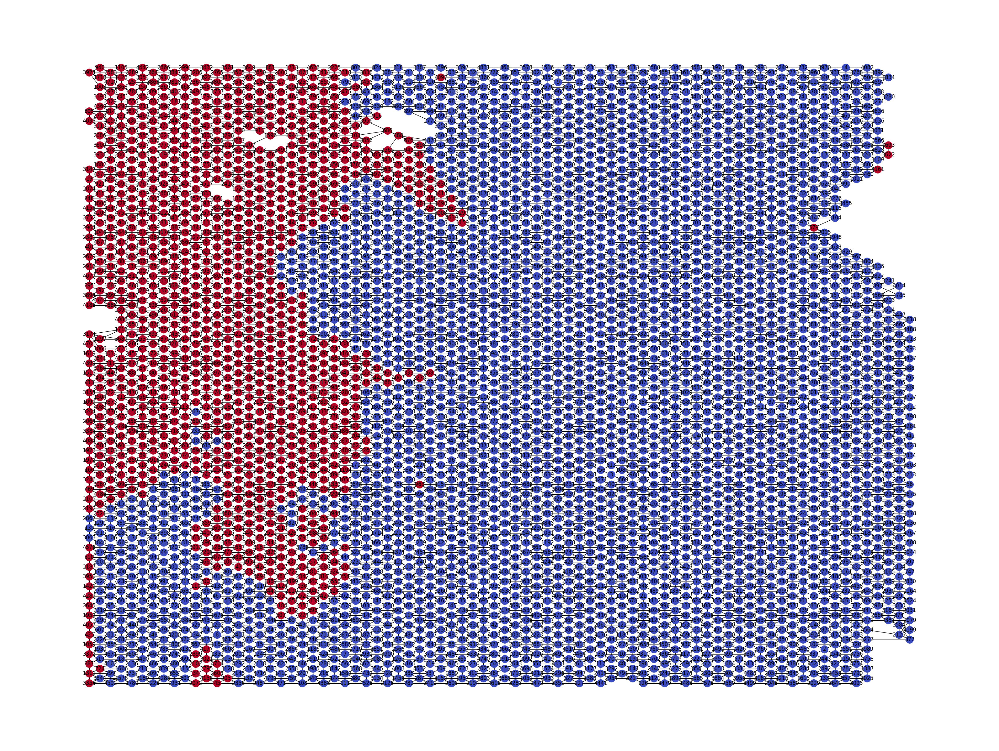

In [18]:
import matplotlib.pyplot as plt

plt.figure(figsize=(32, 24))
nx.draw(G, pos=positions.numpy(), node_color=labels.numpy(), cmap='coolwarm', with_labels=True)
plt.show()

In [10]:
'''num_nodes = 100  # Number of cell clusters
num_features = 3  # Features per node
cell_features = torch.rand((num_nodes, num_features))
positions = torch.rand((num_nodes, 2))
labels = torch.randint(0, 2, (num_nodes,))'''

# Using k-nearest neighbors (k=5) to make adjacency

num_features = len(features[0])
data = from_networkx(G)
data.x = features  
data.y = labels 

In [12]:
class NodeMLP(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim=1):
        super(NodeMLP, self).__init__()
        self.mlp = MLP([input_dim, hidden_dim, output_dim])

    def forward(self, x):
        return torch.sigmoid(self.mlp(x))  # Output initial probabilities (0 to 1)

mlp = NodeMLP(num_features, 16)
initial_probabilities = mlp(data.x).squeeze()

In [13]:
# Graph Laplacian-based diffusion: P_t+1 = (I - alpha * L) P_t
def graph_diffusion(initial_probs, edge_index, num_steps=10, alpha=0.1):
    # Create normalized Laplacian
    from torch_geometric.utils import get_laplacian, to_scipy_sparse_matrix
    
    laplacian_edges, laplacian_weights = get_laplacian(edge_index, normalization='sym')
    laplacian_matrix = to_scipy_sparse_matrix(laplacian_edges, laplacian_weights)
    
    # Convert to torch tensor
    laplacian = torch.tensor(laplacian_matrix.toarray(), dtype=torch.float32)
    I = torch.eye(laplacian.shape[0])

    # Diffusion iteration
    probs = initial_probs
    for _ in range(num_steps):
        probs = (I - alpha * laplacian) @ probs
    
    return probs

In [15]:
num_nodes = len(data.y)
diffused_probs = graph_diffusion(initial_probabilities, data.edge_index)
predictions = (diffused_probs > 0.5).long()

accuracy = (predictions == data.y).sum().item() / num_nodes
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.68


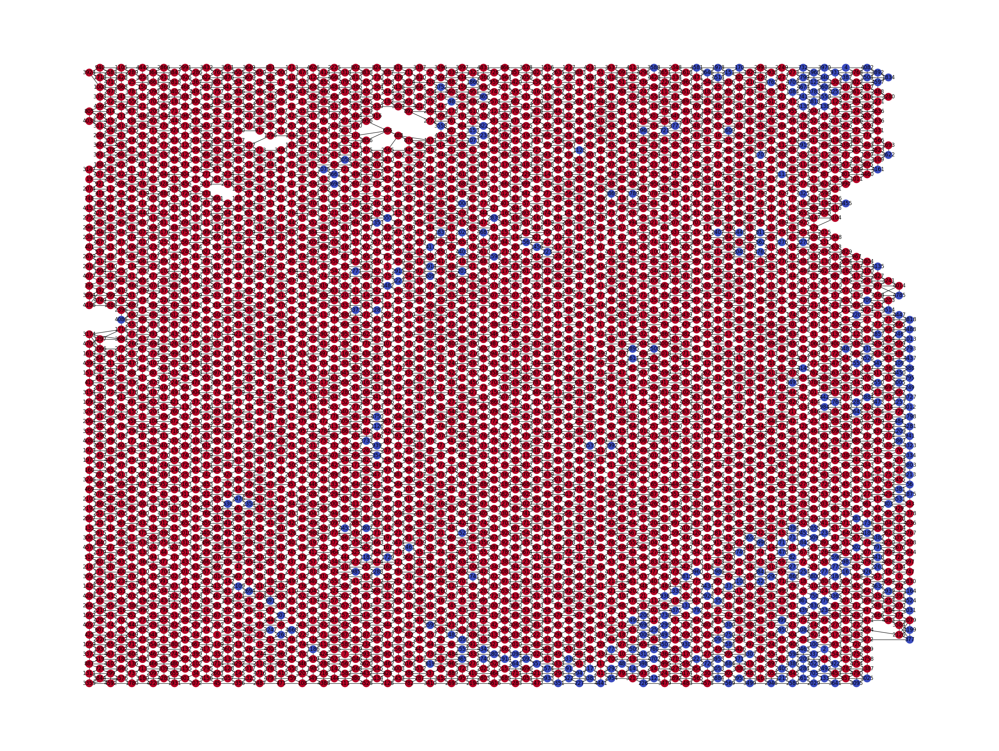

In [17]:

import matplotlib.pyplot as plt

plt.figure(figsize=(32, 24))
nx.draw(G, pos=positions.numpy(), node_color=predictions.numpy(), cmap='coolwarm', with_labels=True)
plt.show()